In [1]:
import numpy as np
import pickle
import os
file = os.path.join('extraction_svm_fct_sigmo.pkl')
with open(file, 'rb') as fichier : extraction_svm = pickle.load(fichier, encoding='latin1')

In [2]:
grid = extraction_svm['grid']

y_train = extraction_svm['y_train']
y_test = extraction_svm['y_test']
y_pred = extraction_svm['y_pred']
X_test = extraction_svm['X_test']
X_train = extraction_svm['X_train']

var = extraction_svm['var']

In [3]:
print(grid.best_params_, '-->', grid.best_score_)

{'C': 0.3247368421052632, 'kernel': 'rbf', 'gamma': 0.11105263157894736} --> 0.8673487332152593


In [4]:
X_train[0,-1]

{'block': 1, 'sujet': 'BMC', 'trial': 54}

In [5]:
faut_pos = {}
faut_neg = {}
for x in range(len(y_pred)) :
    if y_pred[x] != y_test[x] :
        sujet = X_test[x,-1]['sujet']
        block = X_test[x,-1]['block']
        trial = X_test[x,-1]['trial']
        if y_pred[x]==1 :
            if sujet not in faut_neg.keys() :
                faut_neg[sujet] = [[],[],[]]
            faut_neg[sujet][block].append(trial)
        if y_pred[x]==0 :
            if sujet not in faut_pos.keys() :
                faut_pos[sujet] = [[],[],[]]
            faut_pos[sujet][block].append(trial)

In [6]:
sujets = ['AM','BMC','CS','DC','FM','IP','LB','OP','RS','SR','TN','YK']
times = ['2017-10-23_100057','2017-09-26_095637', '2017-10-03_134421','2017-09-27_161040',
        '2017-10-03_143803','2017-09-28_115250', '2017-09-20_151043','2017-10-26_121823',
        '2017-11-08_094717','2017-11-16_153313', '2017-11-08_150410','2017-11-17_172706']

In [7]:
from ANEMO import ANEMO
from ANEMO import read_edf
import matplotlib.pyplot as plt
from inspect import getargspec
%matplotlib inline

In [8]:
def fig(faut) :

    for x in range(len(sujets)) :
        if sujets[x] in faut.keys():
            file = os.path.join('data', 'enregistrement_' + sujets[x] + '_' + times[x] + '.pkl')
            with open(file, 'rb') as fichier : param_exp = pickle.load(fichier, encoding='latin1')

            resultats = os.path.join('data', 'enregistrement_' + sujets[x] + '_' + times[x] + '.asc')
            data = read_edf(resultats, 'TRIALID')

            with open('parametre/fct_velocity_sigmo/param_Fit_%s_fct_velocity_sigmo.pkl'%sujets[x], 'rb') as fichier :
                param_fit = pickle.load(fichier, encoding='latin1')
            
            Plot = ANEMO.Plot(param_exp)

            A = ANEMO(param_exp)
            
            for block in range(3):
                if len(faut[sujets[x]][block])>0 :
                    fig, axs = plt.subplots(len(faut[sujets[x]][block]), 1, figsize=(15, (15*(len(faut[sujets[x]][block])/2))/1.6180))
                    fig.suptitle('%s block %s'%(sujets[x], block), y=1, fontsize=20)
                    a = 0
                    
                    for trial in faut[sujets[x]][block] :
                        if len(faut[sujets[x]][block])>1: ax = axs[a]
                        else : ax = axs
                        
                        
                        trial_data = trial + param_exp['N_trials']*block
                        arg = A.arg(data[trial_data], trial=trial, block=block)
                        trial_data = trial + param_exp['N_trials']*block


                        inde_vars={'x':np.arange(len(data[trial_data]['trackertime']))}
                        
                        
                        
                        param_fit_trial = {}
                        for name in getargspec(ANEMO.Equation.fct_velocity_sigmo).args :
                            if name not in ['x', 'dir_target', 'do_whitening'] :
                                param_fit_trial[name] = param_fit[name][block][trial]
                        param_fit_trial['dir_target'] = arg.dir_target
                        param_fit_trial['do_whitening'] = False
                        
                        ax = Plot.generate_fig(ax=ax, data=data, trial=trial, block=block, fig=fig,
                                               show_data='velocity', equation='fct_velocity_sigmo',
                                               write_step_trial=False,
                                               param_fit=param_fit_trial, inde_vars=inde_vars,
                                               show='fit', show_num_trial=True)

                        a=a+1

                    plt.tight_layout() # to remove too much margin
                    plt.subplots_adjust(hspace=0) # to remove space between figures
                    plt.show()

/home/drone/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: DeprecationWarning: inspect.getargspec() is deprecated, use inspect.signature() instead


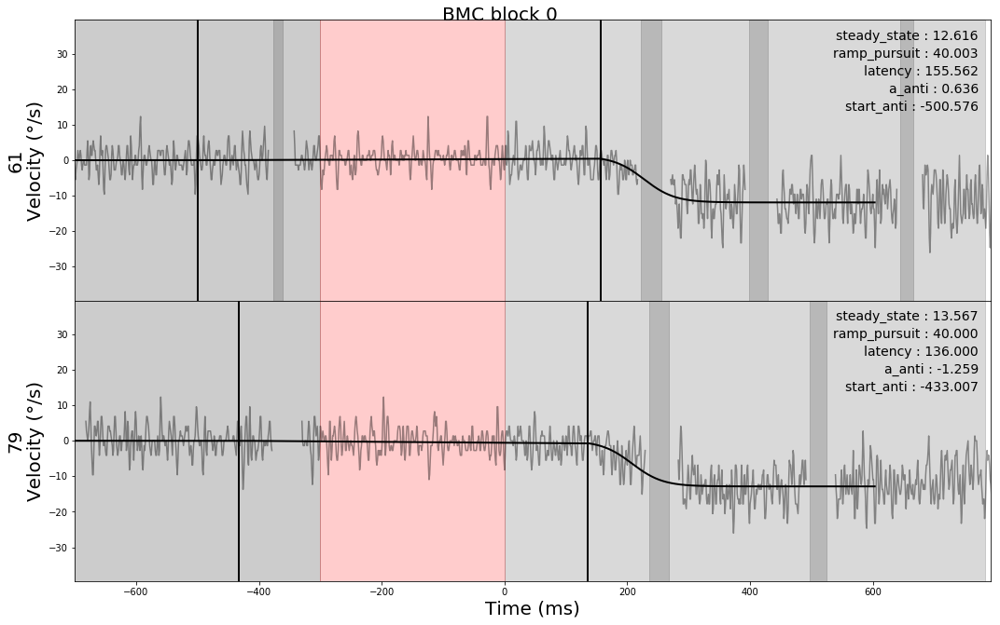

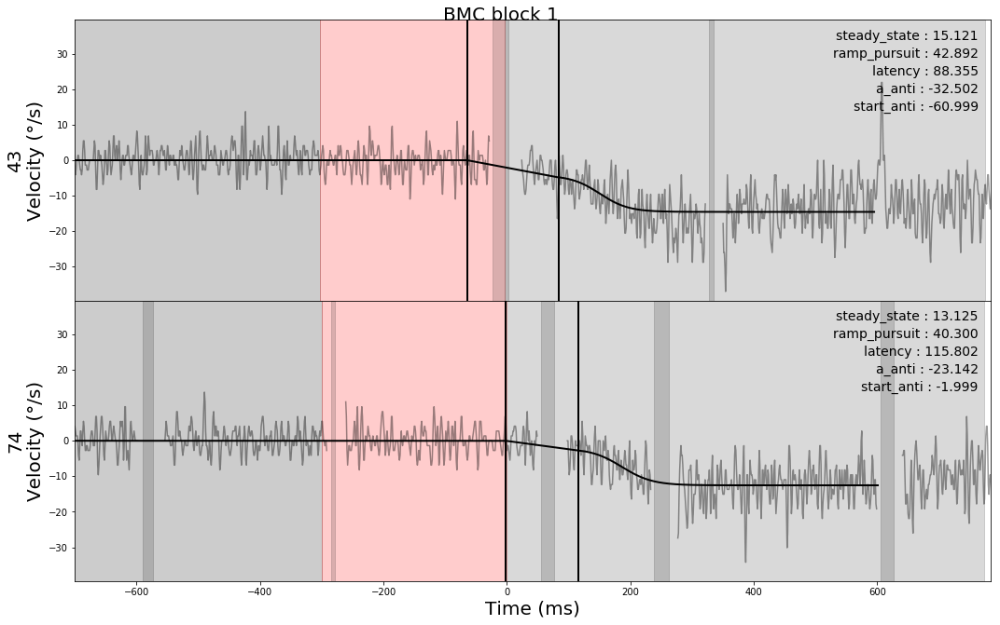

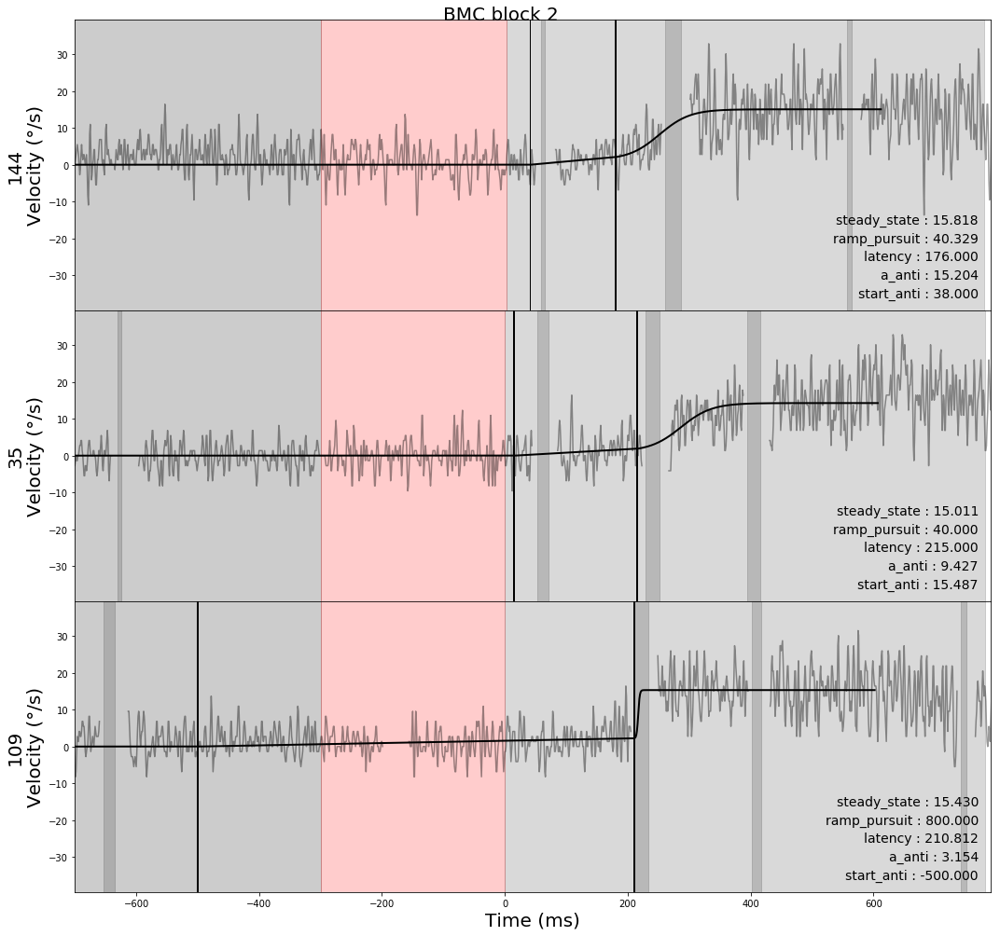

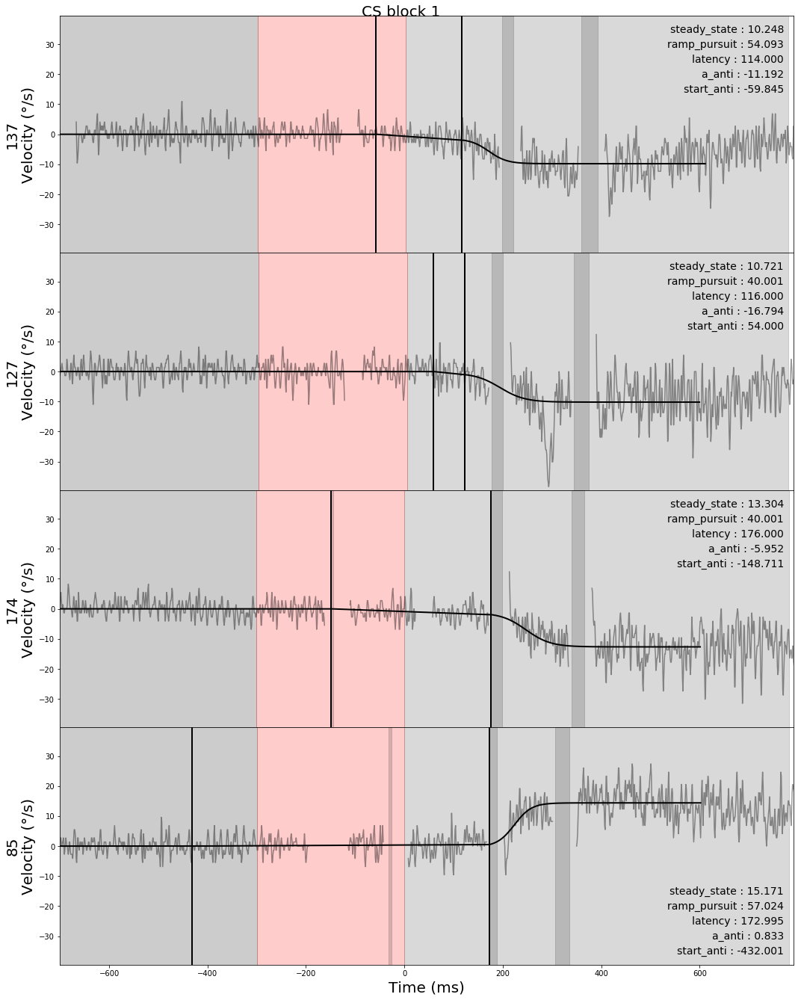

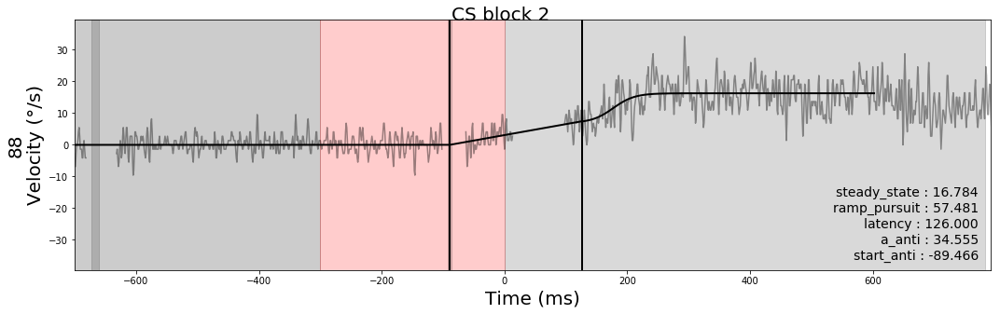

...

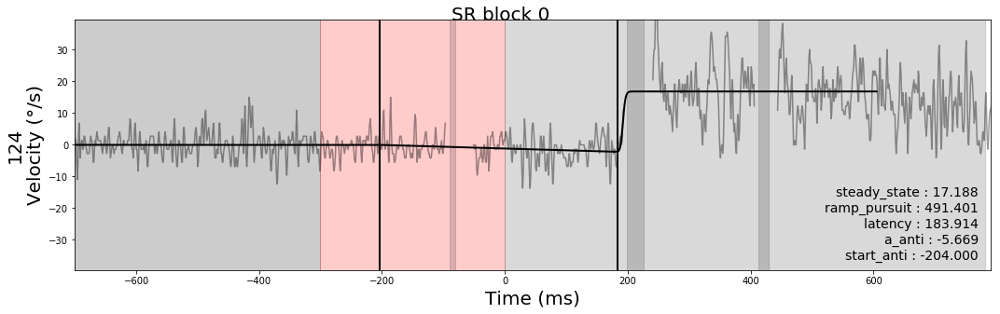

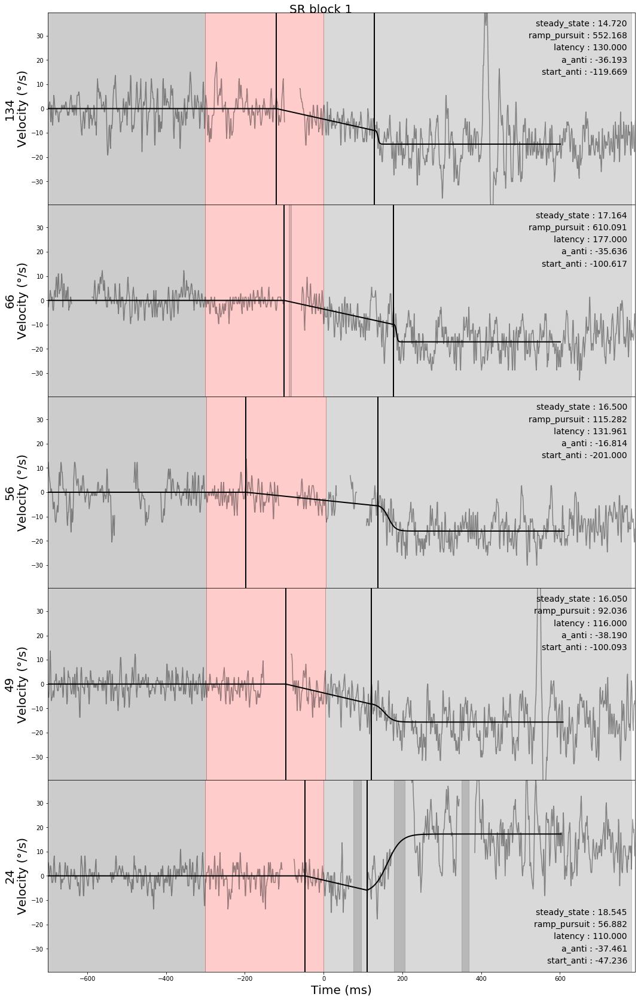

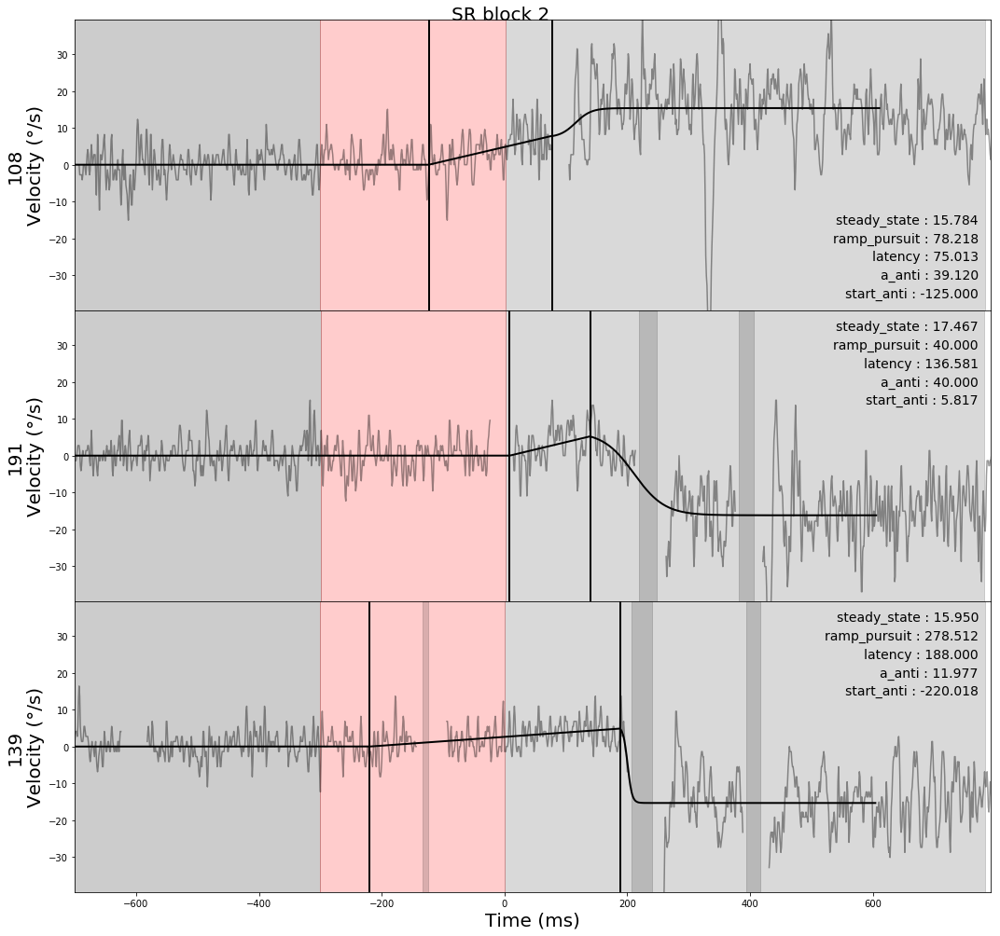

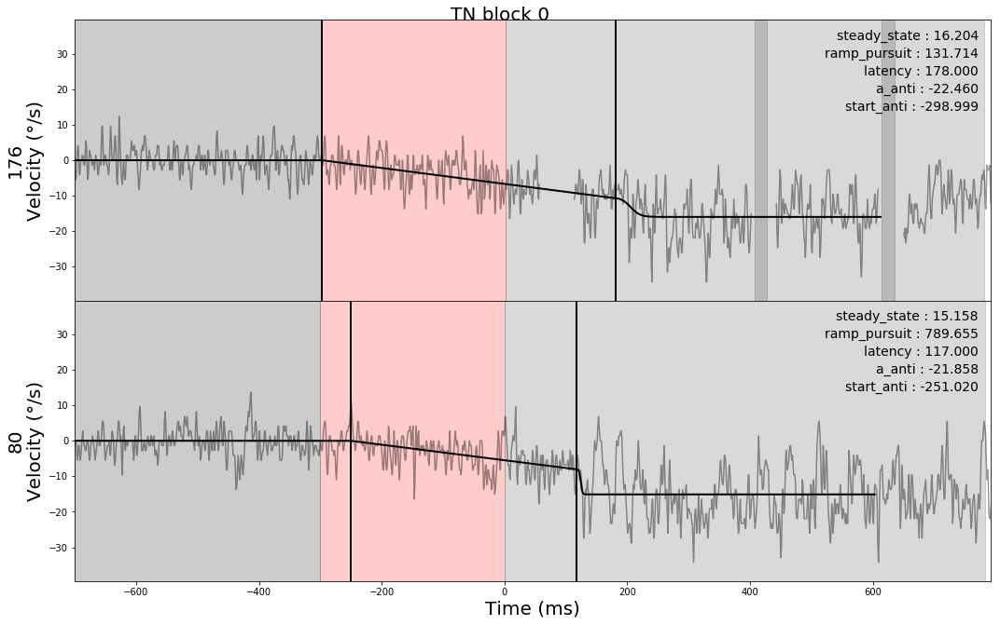

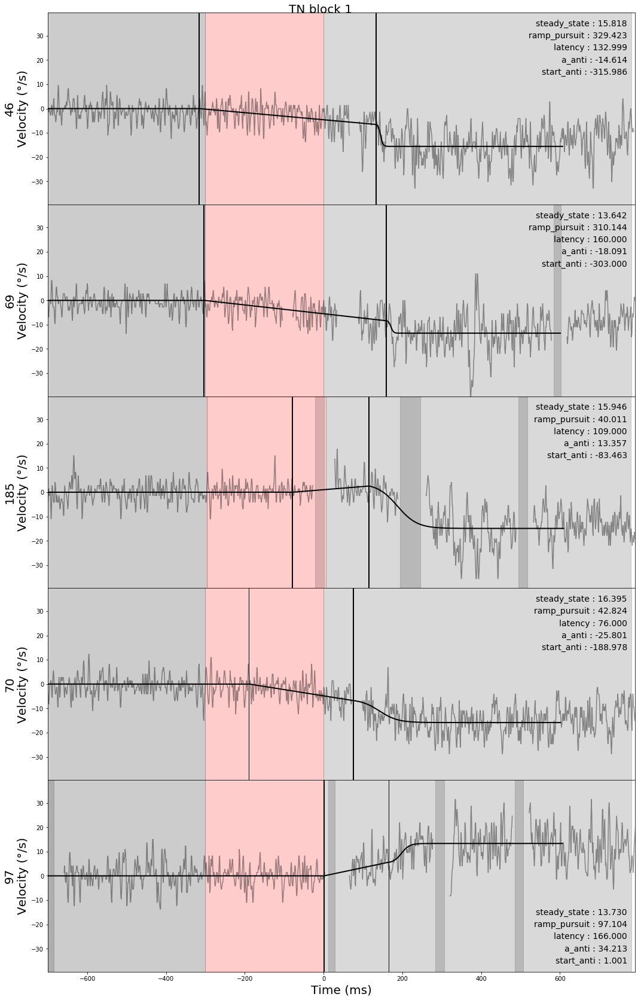

/usr/local/lib/python3.5/dist-packages/ANEMO-0.0.1-py3.5.egg/ANEMO/ANEMO.py:444: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.5/dist-packages/ANEMO-0.0.1-py3.5.egg/ANEMO/ANEMO.py:444: RuntimeWarning: invalid value encountered in true_divide


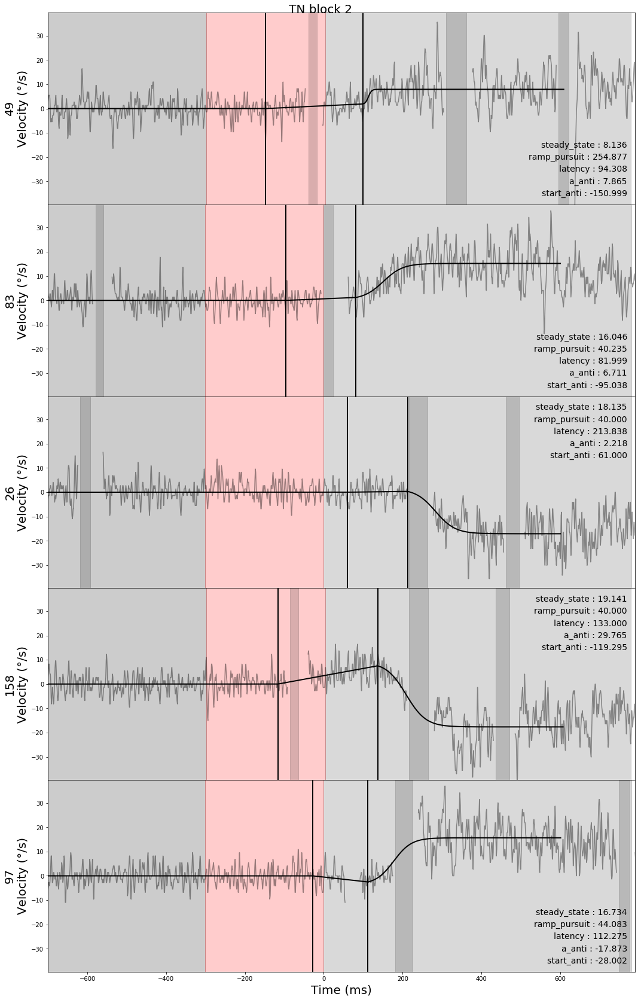

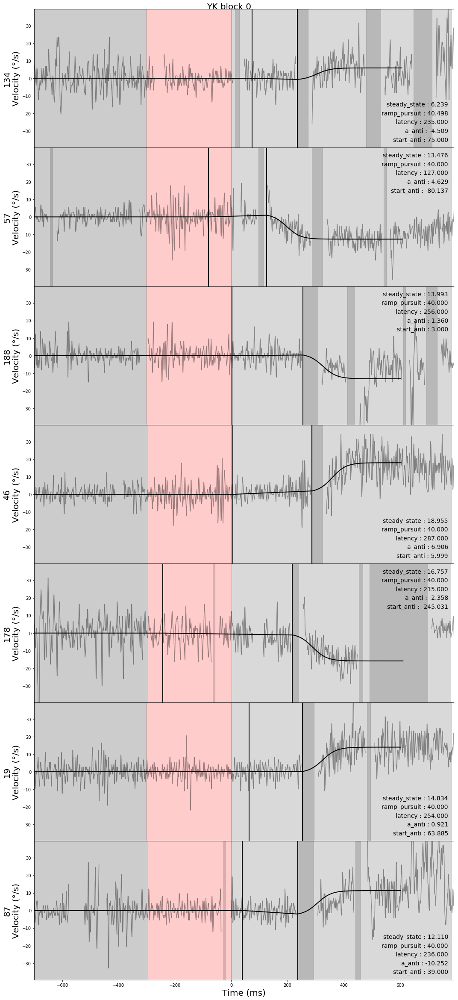

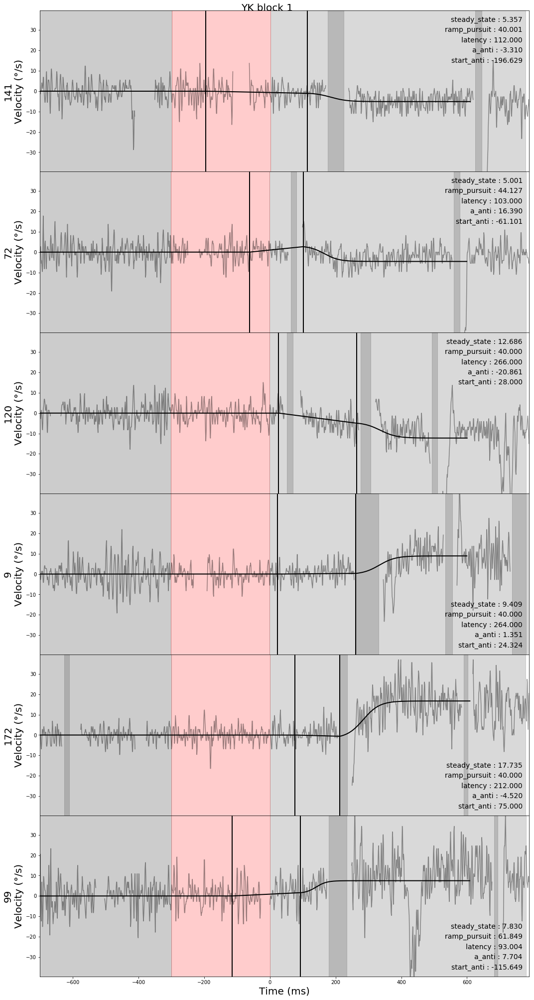

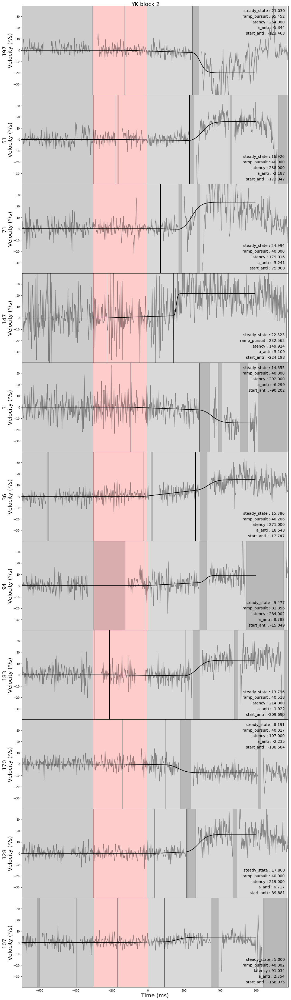

In [9]:
# faut négatif
fig(faut_neg)

/home/drone/.local/lib/python3.5/site-packages/ipykernel_launcher.py:39: DeprecationWarning: inspect.getargspec() is deprecated, use inspect.signature() instead


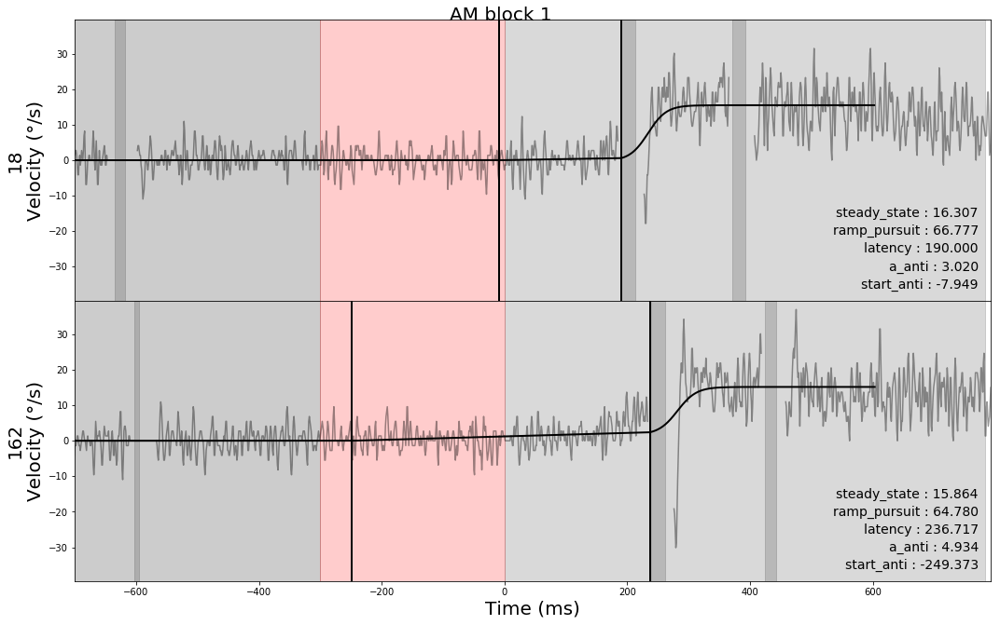

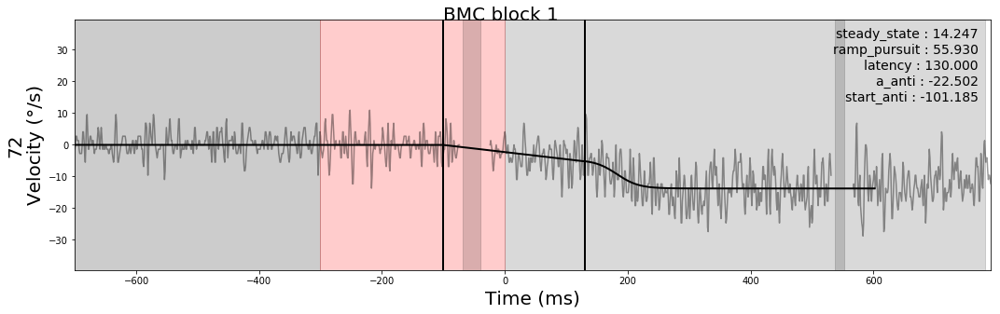

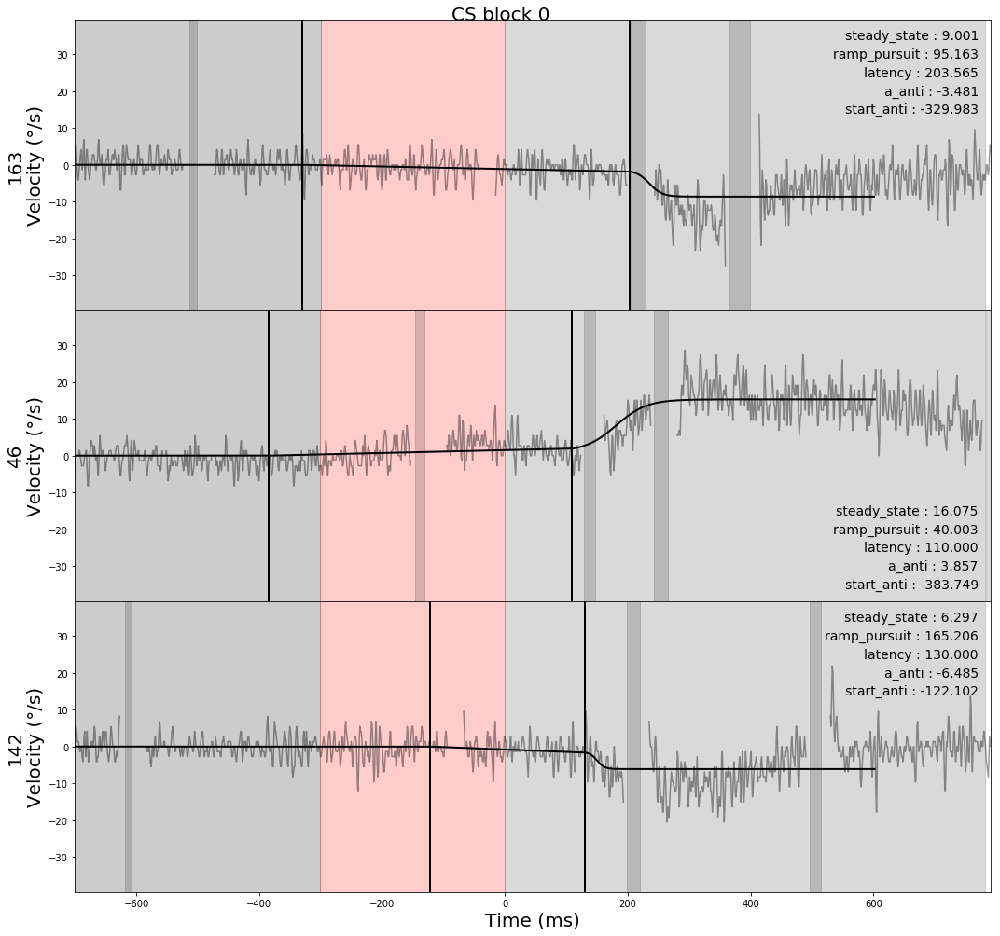

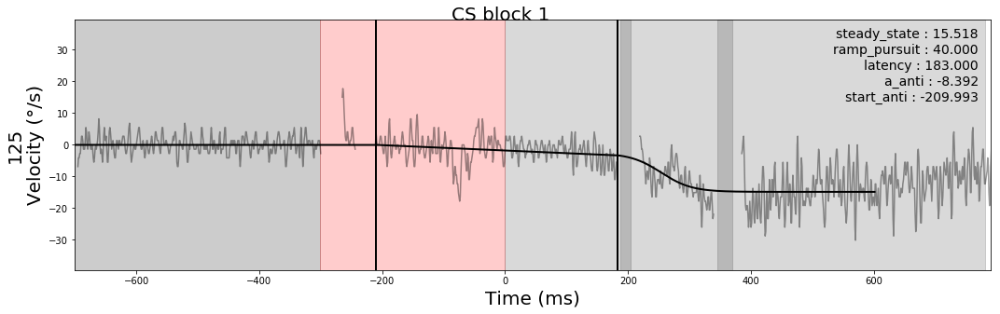

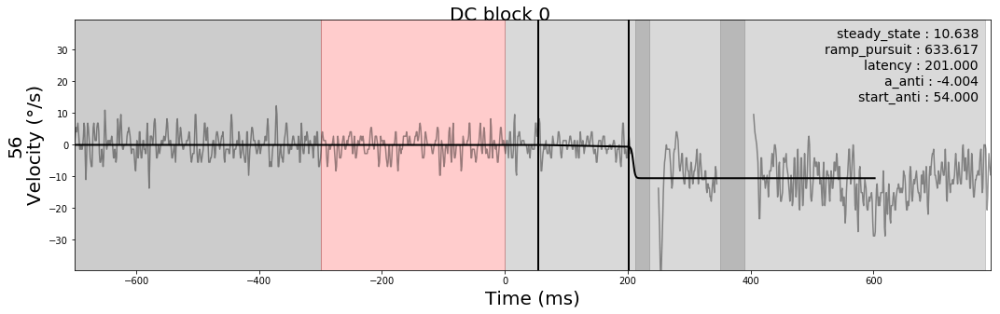

...

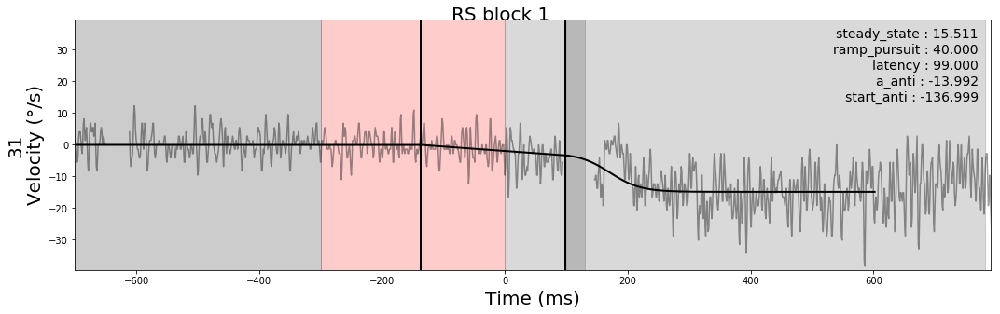

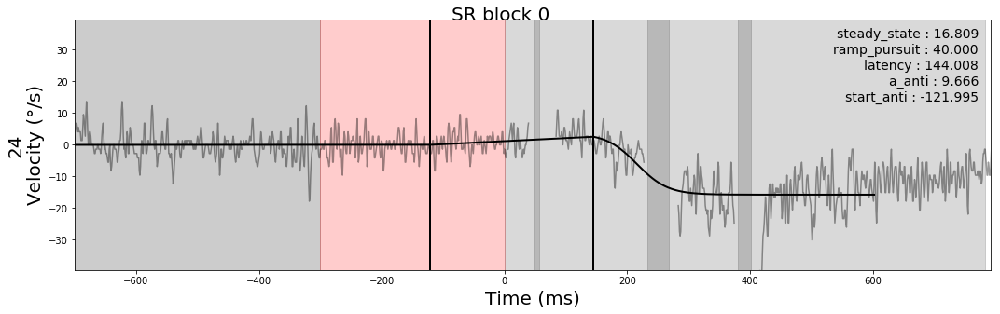

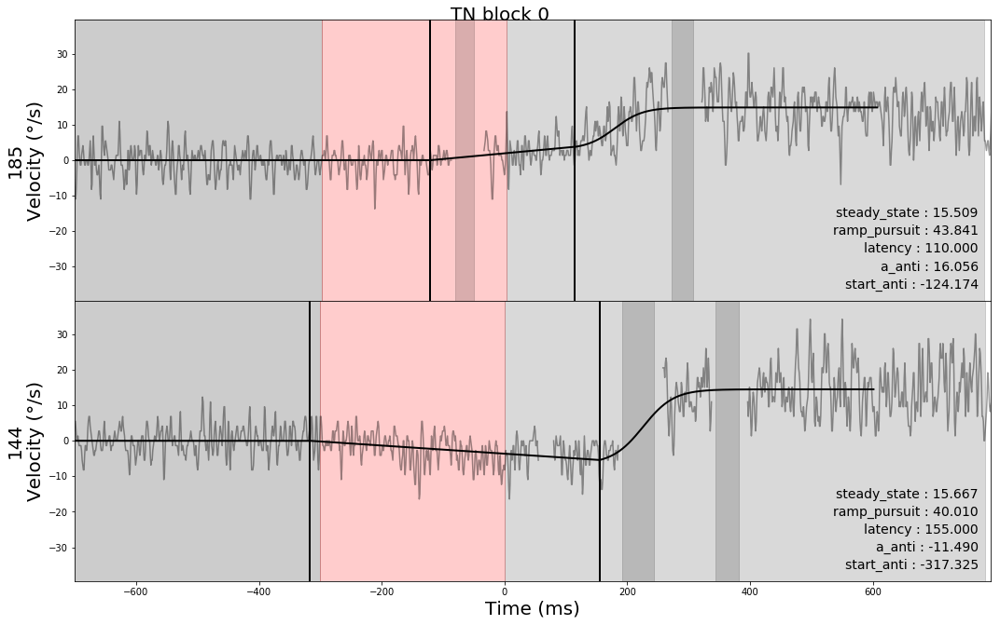

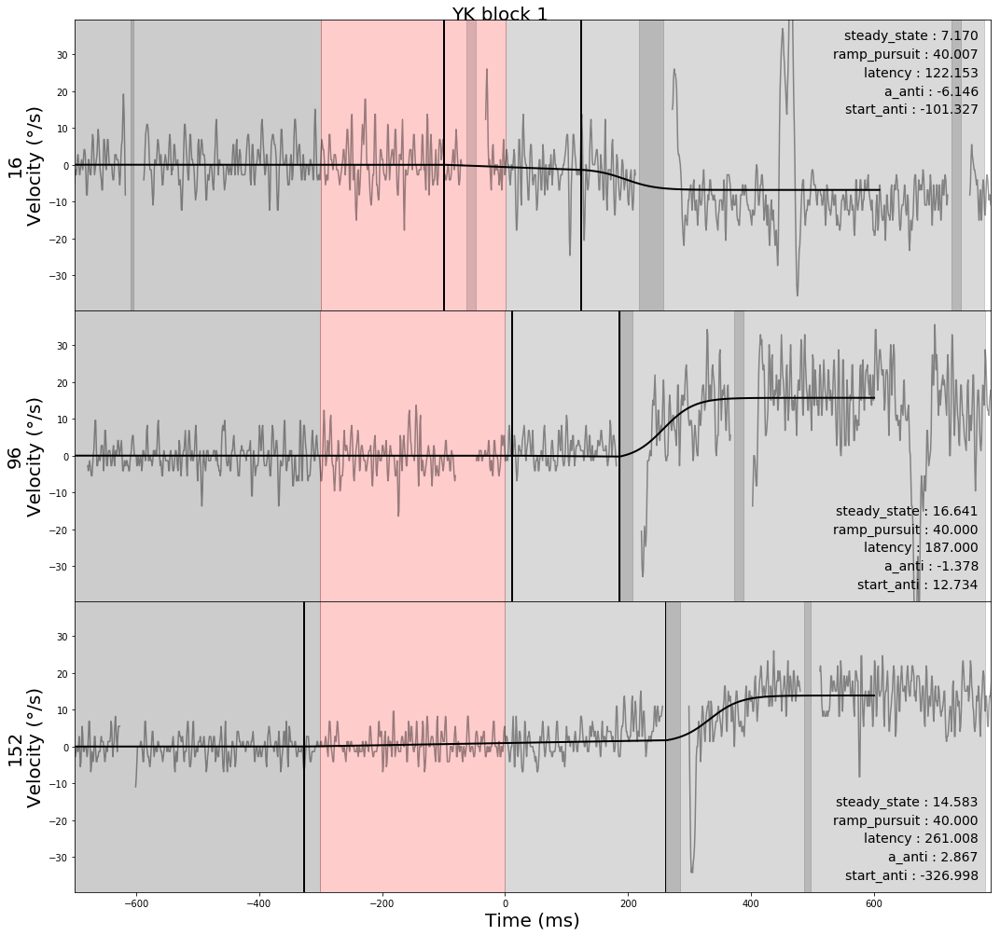

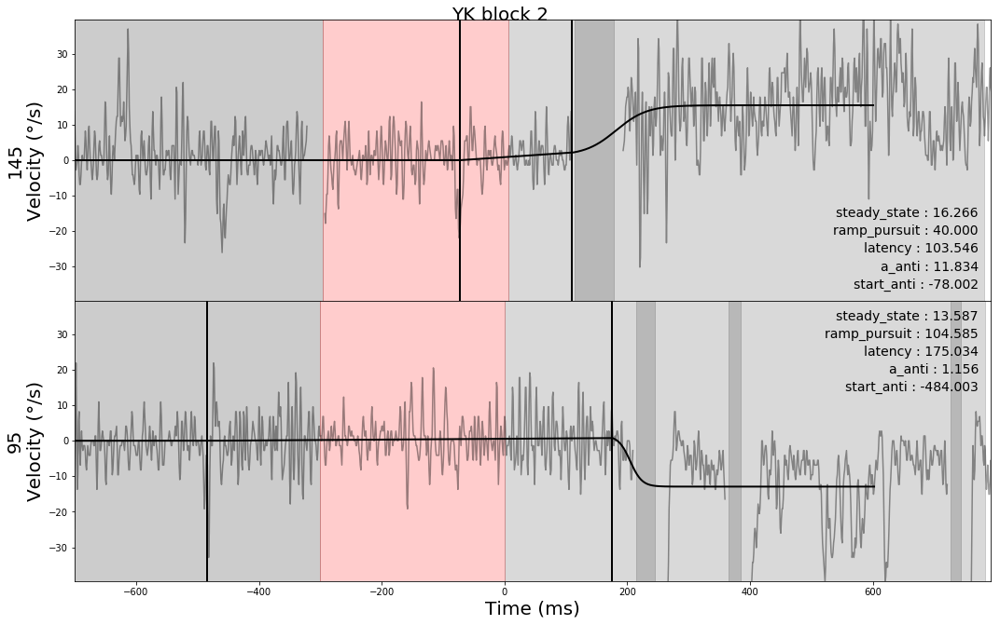

In [10]:
# faut positif
fig(faut_pos)